<a href="https://colab.research.google.com/github/danielbenhur/NEADES_daniel/blob/main/Aula3_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Aula 3: Automatizando rotinas de geoprocessamento com Python

#1. Automatizando downloads

In [1]:
# Importe a BeautifulSoup e os componentes URLLIB
from bs4 import BeautifulSoup
from urllib.request import Request, urlopen, urlretrieve

In [2]:
#Definindo variável com endereço
ende="https://ftp.ibge.gov.br/Censos/Censo_Demografico_2010/Resultados_do_Universo/Agregados_por_Setores_Censitarios/"
# Criando um objeto do tipo request que representa a requisição que você está fazendo
requi= Request(ende)

In [3]:
# Obtendo todo o conteúdo da página
html_pag= urlopen(ende)
html_pag

In [4]:
#Utilizando o lxml como parser para ler a estrutura e conteúdo da resposta HTTP
sopa = BeautifulSoup(html_pag,"lxml") #Como não é um dataframe, não posso usar o head(), então uso o BeautifulSoup
#Inspecionando o resultado
sopa

<!DOCTYPE HTML PUBLIC "-//W3C//DTD HTML 3.2 Final//EN">
<html>
<head>
<title>Index of /Censos/Censo_Demografico_2010/Resultados_do_Universo/Agregados_por_Setores_Censitarios</title>
</head>
<body>
<h1>Index of /Censos/Censo_Demografico_2010/Resultados_do_Universo/Agregados_por_Setores_Censitarios</h1>
<table>
<tr><th valign="top"><img alt="[ICO]" src="/icons/blank.gif"/></th><th><a href="?C=N;O=D">Name</a></th><th><a href="?C=M;O=A">Last modified</a></th><th><a href="?C=S;O=A">Size</a></th><th><a href="?C=D;O=A">Description</a></th></tr>
<tr><th colspan="5"><hr/></th></tr>
<tr><td valign="top"><img alt="[PARENTDIR]" src="/icons/back.gif"/></td><td><a href="/Censos/Censo_Demografico_2010/Resultados_do_Universo/">Parent Directory</a> </td><td> </td><td align="right">  - </td><td> </td></tr>
<tr><td valign="top"><img alt="[TXT]" src="/icons/text.gif"/></td><td><a href="1_Atualizacoes_20200219.txt">1_Atualizacoes_20200..&gt;</a></td><td align="right">2020-02-19 09:22  </td><td align="right

In [5]:
# Indentificar todos os links da página
for link in sopa.findAll("a"):
  print(link)


<a href="?C=N;O=D">Name</a>
<a href="?C=M;O=A">Last modified</a>
<a href="?C=S;O=A">Size</a>
<a href="?C=D;O=A">Description</a>
<a href="/Censos/Censo_Demografico_2010/Resultados_do_Universo/">Parent Directory</a>
<a href="1_Atualizacoes_20200219.txt">1_Atualizacoes_20200..&gt;</a>
<a href="AC_20171016.zip">AC_20171016.zip</a>
<a href="AL_20171016.zip">AL_20171016.zip</a>
<a href="AM_20171016.zip">AM_20171016.zip</a>
<a href="AP_20171016.zip">AP_20171016.zip</a>
<a href="BA_20171016.zip">BA_20171016.zip</a>
<a href="CE_20171016.zip">CE_20171016.zip</a>
<a href="DF_20171016.zip">DF_20171016.zip</a>
<a href="Documentacao_Agregado_dos_Setores_20180416.zip">Documentacao_Agregad..&gt;</a>
<a href="ES_20171016.zip">ES_20171016.zip</a>
<a href="GO_20171016.zip">GO_20171016.zip</a>
<a href="MA_20171016.zip">MA_20171016.zip</a>
<a href="MG_20171016.zip">MG_20171016.zip</a>
<a href="MS_20171016.zip">MS_20171016.zip</a>
<a href="MT_20171016.zip">MT_20171016.zip</a>
<a href="PA_20171016.zip">PA_20

In [6]:
#Exemplo do último link 
link.get("href")

'TO_20171016.zip'

In [7]:
#Criando lista vazia
links=[]
#Iniciando o loop pelos links da página
for link in sopa.findAll("a"):  # "a" é na linguagem xml a marcação que indica a presença de link
  #Extraindo o nome do arquivo e adicionando a lista links
  links.append(link.get('href'))
#Inspecionando os resultados
print(links)

['?C=N;O=D', '?C=M;O=A', '?C=S;O=A', '?C=D;O=A', '/Censos/Censo_Demografico_2010/Resultados_do_Universo/', '1_Atualizacoes_20200219.txt', 'AC_20171016.zip', 'AL_20171016.zip', 'AM_20171016.zip', 'AP_20171016.zip', 'BA_20171016.zip', 'CE_20171016.zip', 'DF_20171016.zip', 'Documentacao_Agregado_dos_Setores_20180416.zip', 'ES_20171016.zip', 'GO_20171016.zip', 'MA_20171016.zip', 'MG_20171016.zip', 'MS_20171016.zip', 'MT_20171016.zip', 'PA_20171016.zip', 'PB_20171016.zip', 'PE_20200219.zip', 'PI_20171016.zip', 'PR_20171016.zip', 'RJ_20171016.zip', 'RN_20171016.zip', 'RO_20171016.zip', 'RR_20171016.zip', 'RS_20171016.zip', 'SC_20171016.zip', 'SE_20171016.zip', 'SP_Capital_20190823.zip', 'SP_Exceto_a_Capital_20190207.zip', 'TO_20171016.zip']


In [8]:
for link in links:
  try:
    urlretrieve(url=ende+link, filename=link)
  except:
    continue

#Conectando Goolge Colab com Google Drive

In [9]:
from google.colab import drive

In [11]:
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
!pip install geopandas==0.12.0 -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 75.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 96.8 MB/s eta 0:00:00


In [17]:
import geopandas as gpd

In [18]:
censo_uf=gpd.read_file("/content/drive/MyDrive/dados_aula3")

In [19]:
censo_uf.head()

,CD_SETOR,CD_SIT,NM_SIT,CD_UF,NM_UF,SIGLA_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,CD_SUBDIST,NM_SUBDIST,geometry
0,330010005000001,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.31870 -23.00903, -44.31871 -23.0..."
1,330010005000002,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.31854 -23.00689, -44.31827 -23.0..."
2,330010005000003,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.32053 -23.01094, -44.32053 -23.0..."
3,330010005000004,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.32297 -23.01213, -44.32307 -23.0..."
4,330010005000005,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.32319 -23.00896, -44.32323 -23.0..."


<Axes: >

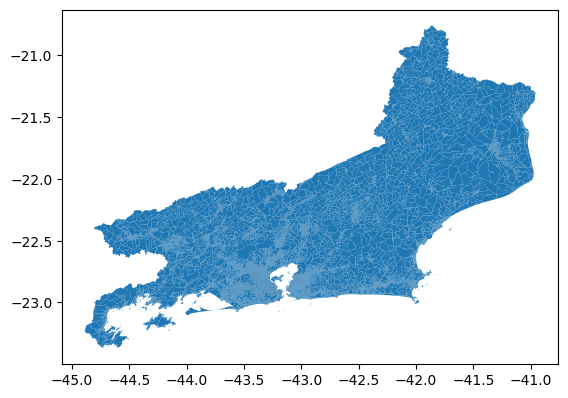

In [20]:
censo_uf.plot()

#Lendo arquivos do seu computados para Google Colab

In [21]:
#Importe a biblioteca
from google.colab import files
# Faça  upload do arquivo
uploaded=files.upload()

Saving Básico_RJ_Sample.csv to Básico_RJ_Sample.csv


In [23]:
import pandas as pd
#Leia os dados e especifique o separador, o decimal e a codificação
censo=pd.read_csv("/content/Básico_RJ_Sample.csv")
censo.head()

,Unnamed: 0,Cod_setor,V001,V002
0,0,330010005000001,156.0,409.0
1,1,330010005000002,57.0,143.0
2,2,330010005000003,343.0,1055.0
3,3,330010005000004,72.0,219.0
4,4,330010005000005,212.0,709.0


In [26]:
#Selecionando apenas as colunas de interesse
censo=censo[["Cod_setor","V002"]]
#Verificando resultado
censo.head()

,Cod_setor,V002
0,330010005000001,409.0
1,330010005000002,143.0
2,330010005000003,1055.0
3,330010005000004,219.0
4,330010005000005,709.0


#4. Table join no Python

In [27]:
#Verificando o tipo de dados para a coluna com os códigos dos setores censitários
censo_uf.CD_SETOR.dtype

dtype('O')

In [30]:
#Verificando o tipo de dados para a coluna com os códigos dos setores censitários
censo.Cod_setor.dtype

dtype('int64')

In [34]:
#Modificando de objeto para inteiro
censo_uf.CD_SETOR=censo_uf.CD_SETOR.astype(int)
#Inspecionando nosso geoDataFrame
censo_uf.CD_SETOR.dtype

dtype('int64')

In [35]:
censo_uf.head()

,CD_SETOR,CD_SIT,NM_SIT,CD_UF,NM_UF,SIGLA_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,CD_SUBDIST,NM_SUBDIST,geometry
0,330010005000001,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.31870 -23.00903, -44.31871 -23.0..."
1,330010005000002,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.31854 -23.00689, -44.31827 -23.0..."
2,330010005000003,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.32053 -23.01094, -44.32053 -23.0..."
3,330010005000004,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.32297 -23.01213, -44.32307 -23.0..."
4,330010005000005,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.32319 -23.00896, -44.32323 -23.0..."


In [38]:
#Realizando o table join
dados=censo_uf.merge(censo,left_on="CD_SETOR", right_on="Cod_setor")
dados.head()

,CD_SETOR,CD_SIT,NM_SIT,CD_UF,NM_UF,SIGLA_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,CD_SUBDIST,NM_SUBDIST,geometry,Cod_setor,V002
0,330010005000001,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.31870 -23.00903, -44.31871 -23.0...",330010005000001,409.0
1,330010005000002,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.31854 -23.00689, -44.31827 -23.0...",330010005000002,143.0
2,330010005000003,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.32053 -23.01094, -44.32053 -23.0...",330010005000003,1055.0
3,330010005000004,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.32297 -23.01213, -44.32307 -23.0...",330010005000004,219.0
4,330010005000005,1,Área Urbana de Alta Densidade de Edificações,33,Rio de Janeiro,RJ,3300100,Angra dos Reis,330010005,Angra dos Reis,33001000500,NaN,"POLYGON ((-44.32319 -23.00896, -44.32323 -23.0...",330010005000005,709.0


#5.Automatizando a geração de mapas



In [39]:
!pip install mapclassify -q

In [40]:
import matplotlib.pyplot as plt

<ipython-input-56-1a9af77b0eb9>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,eixo=plt.subplots(figsize=(10,10))


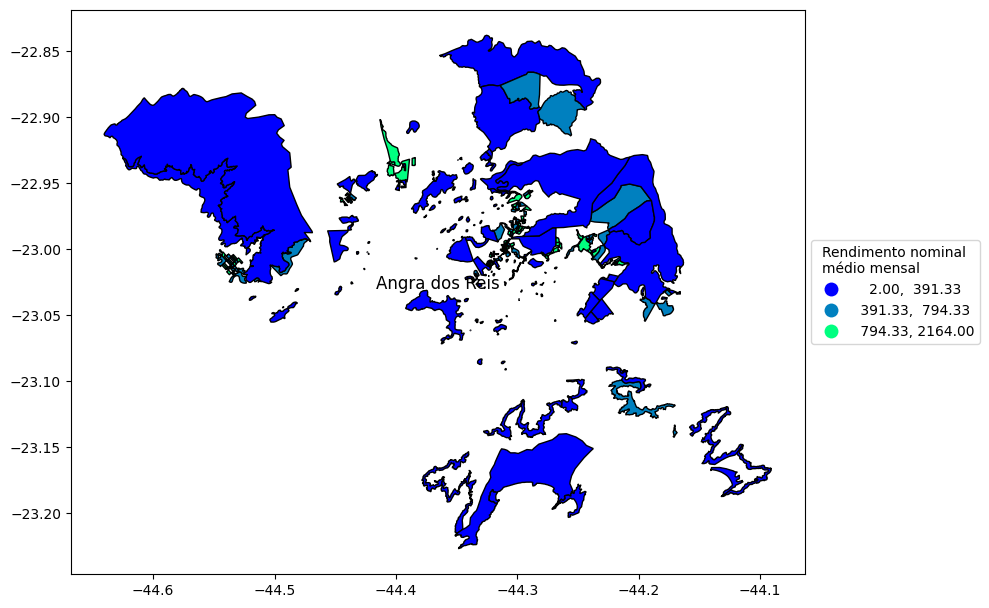

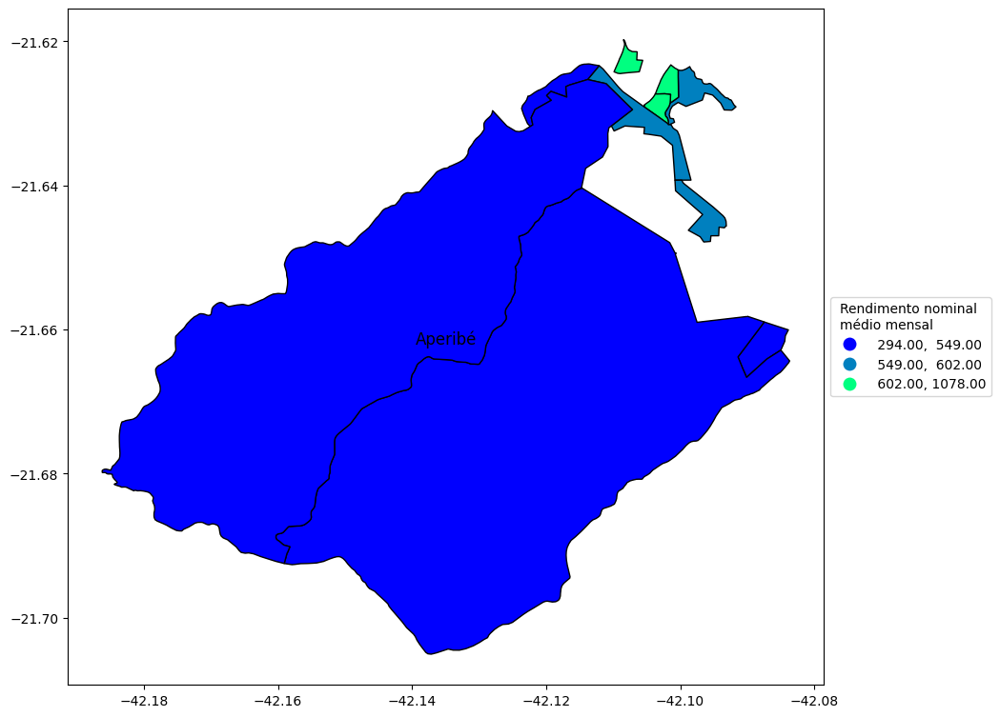

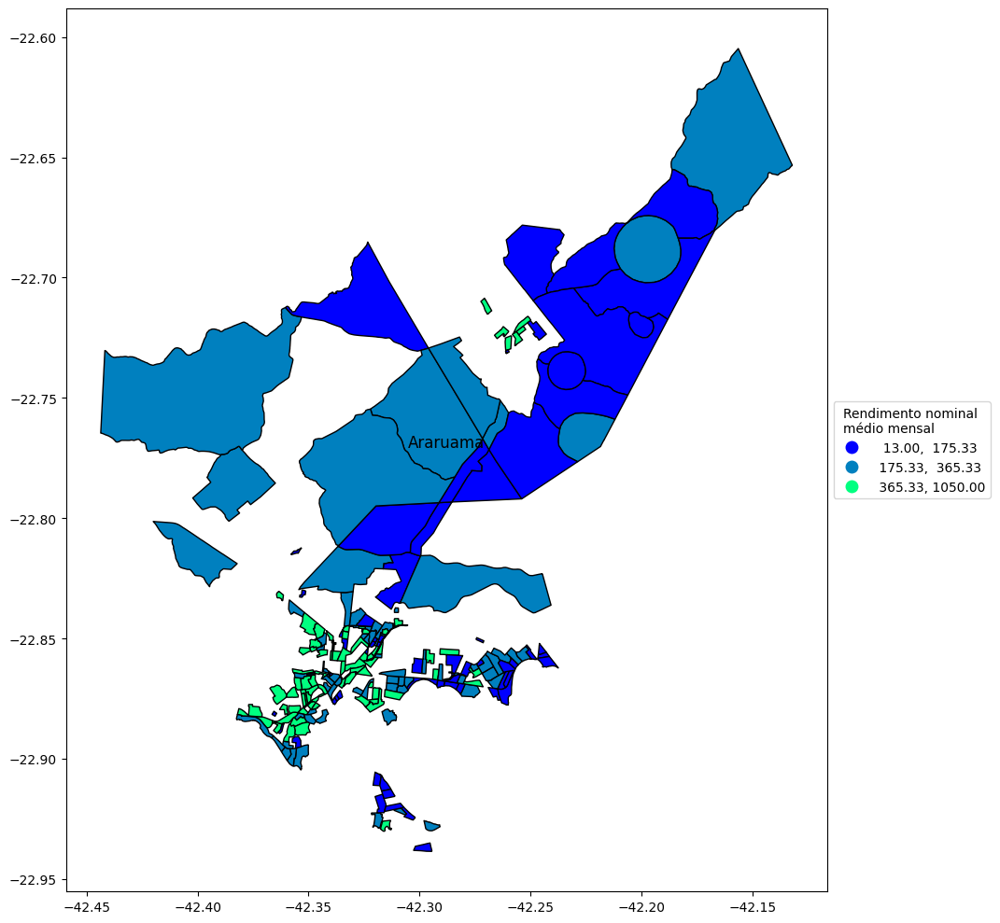

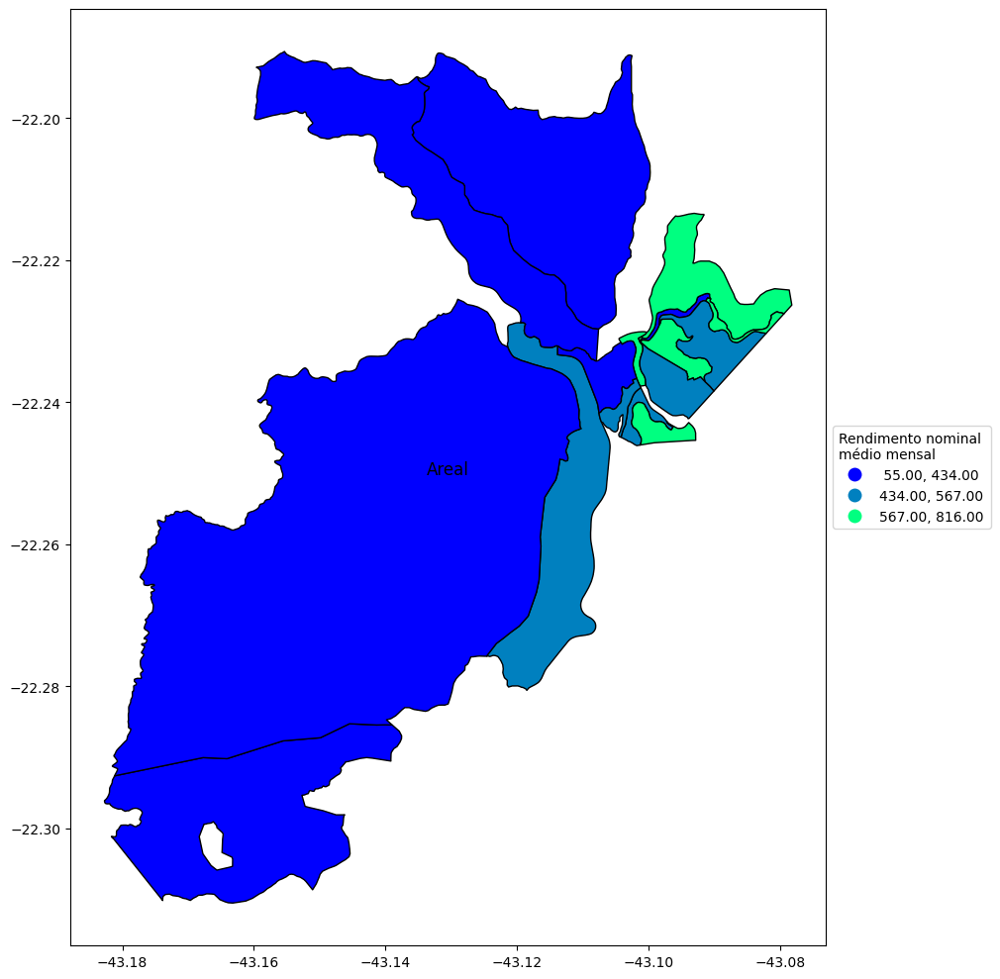

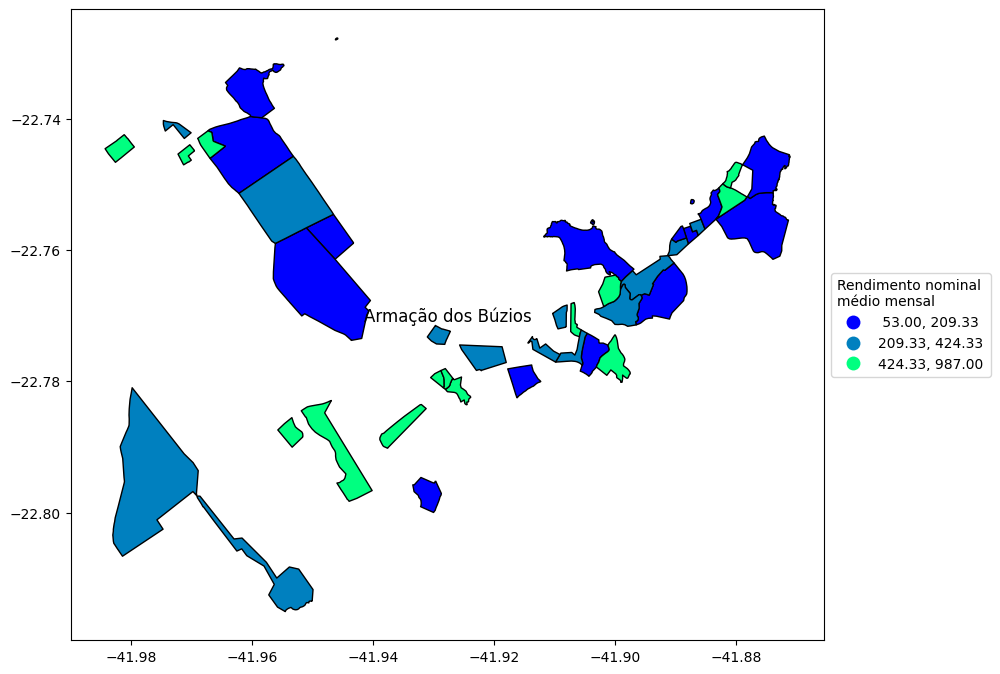

...

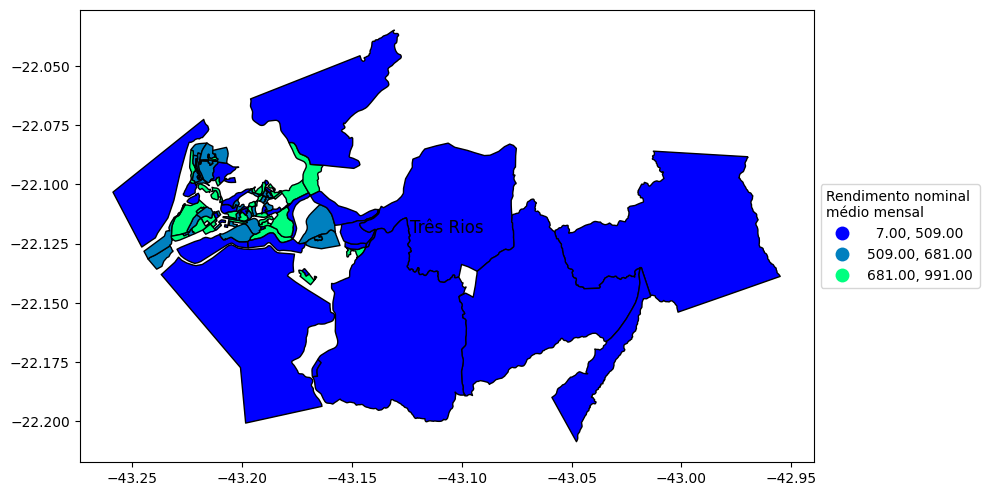

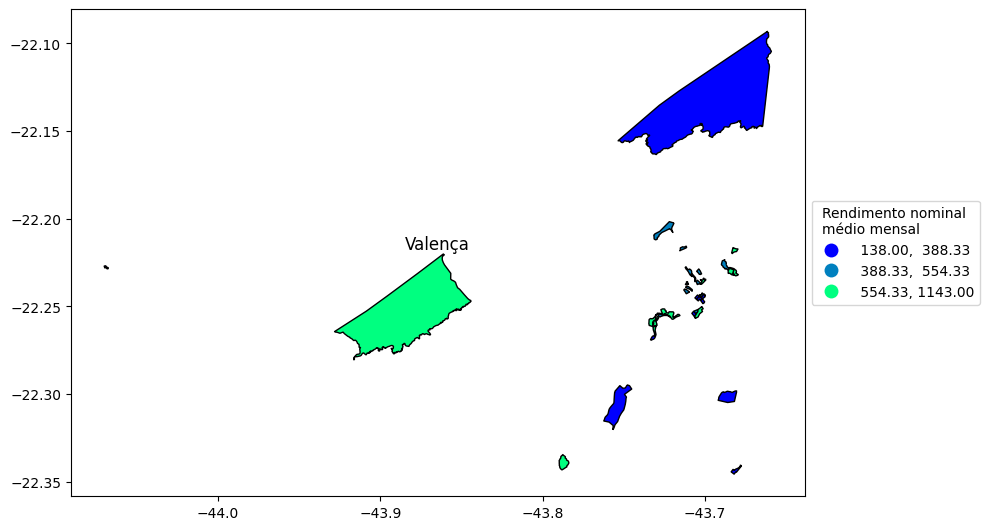

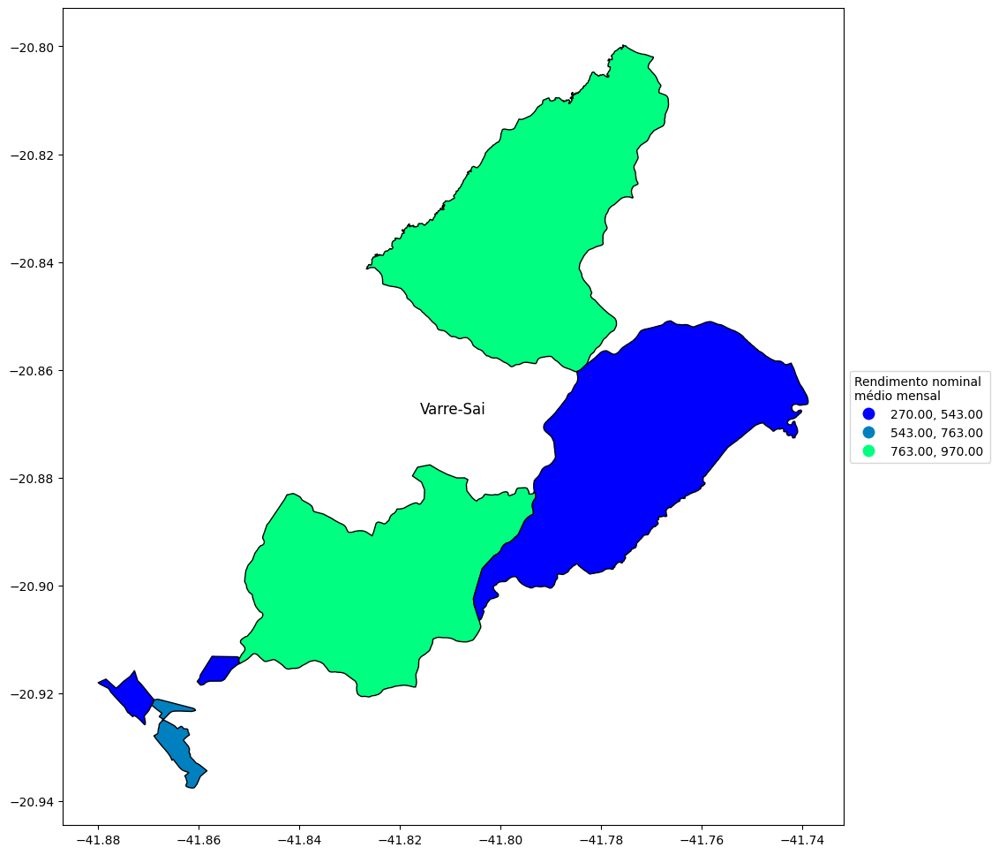

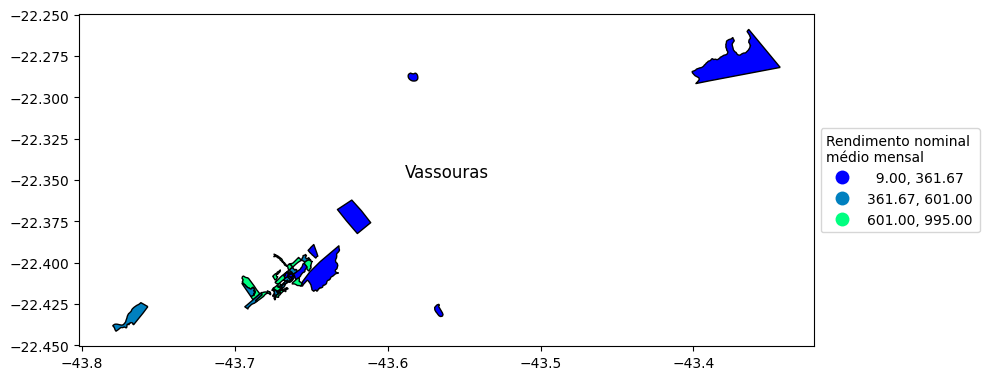

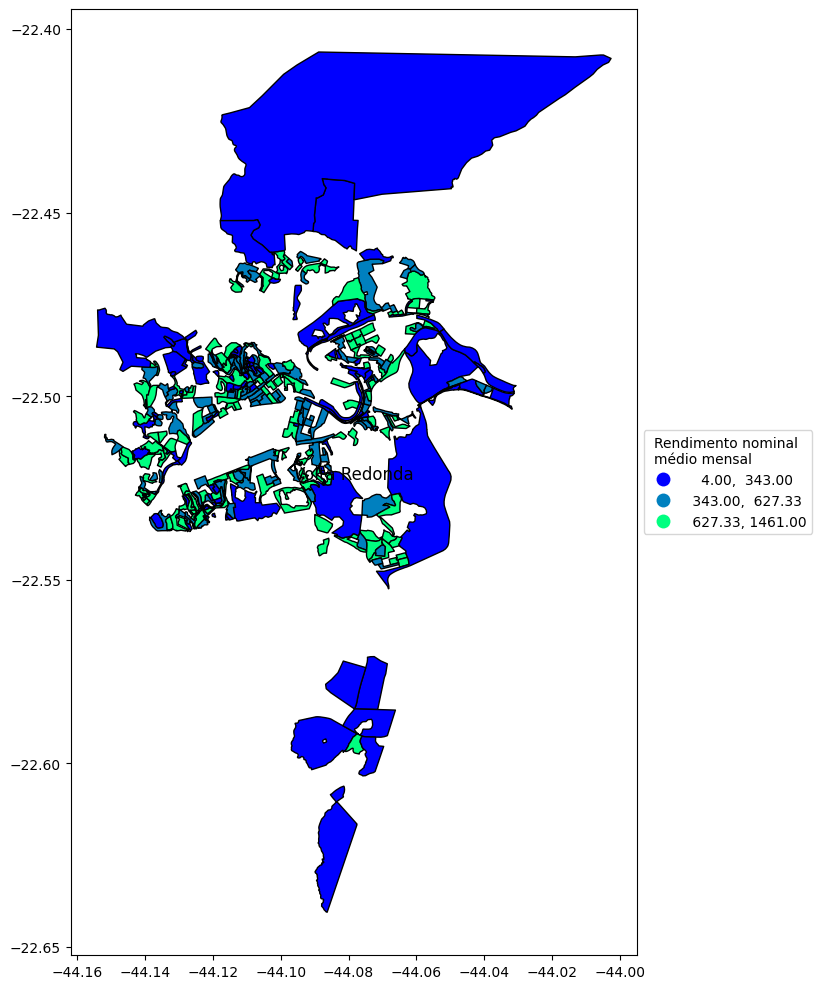

In [56]:
for i in pd.unique(dados.NM_MUN):
  fig,eixo=plt.subplots(figsize=(10,10))
  selec=dados[dados.NM_MUN==i]
  selec.plot(column="V002", ax=eixo, scheme='quantiles', k=3, cmap="winter", 
             edgecolor="k", legend=True, legend_kwds={"loc":"center left",
                                                      "bbox_to_anchor":(1,0.5), 
                                                      "title": "Rendimento nominal \nmédio mensal"})
  eixo.set_title(i,x=0.5, y=0.5, va="center")
  fig.subplots_adjust(top=0.75)
  fig.tight_layout()
  caminho="/content/drive/MyDrive/dados_aula3/"+i.replace(" ","_")+".jpeg"
  fig.savefig(caminho, dpi=300)

In [57]:
!zip -r /content/Mapas.zip /content/drive/MyDrive/dados_aula3

  adding: content/drive/MyDrive/dados_aula3/ (stored 0%)
  adding: content/drive/MyDrive/dados_aula3/RJ_Setores_2021.dbf (deflated 99%)
  adding: content/drive/MyDrive/dados_aula3/link_ibge.txt (deflated 12%)
  adding: content/drive/MyDrive/dados_aula3/Básico_RJ_Sample.csv (deflated 73%)
  adding: content/drive/MyDrive/dados_aula3/RJ_Setores_2021.cpg (stored 0%)
  adding: content/drive/MyDrive/dados_aula3/RJ_Setores_2021.shp (deflated 37%)
  adding: content/drive/MyDrive/dados_aula3/RJ_Setores_2021.shx (deflated 43%)
  adding: content/drive/MyDrive/dados_aula3/RJ_Setores_2021.prj (deflated 18%)
  adding: content/drive/MyDrive/dados_aula3/Angra_dos_Reis.jpeg (deflated 40%)
  adding: content/drive/MyDrive/dados_aula3/Aperibé.jpeg (deflated 58%)
  adding: content/drive/MyDrive/dados_aula3/Araruama.jpeg (deflated 39%)
  adding: content/drive/MyDrive/dados_aula3/Areal.jpeg (deflated 48%)
  adding: content/drive/MyDrive/dados_aula3/Armação_dos_Búzios.jpeg (deflated 51%)
  adding: conten

In [ ]:
#Fazendo download
files.download("/content/Mapas.zip")